In [1]:
from cleaning_data import read_multiple_days
df = read_multiple_days('Fri Jan 1, 2021', 200)
df.tail()

Added df for: Fri Jan 1, 2021
Added df for: Sat Jan 2, 2021
Added df for: Sun Jan 3, 2021
Added df for: Mon Jan 4, 2021
Added df for: Tue Jan 5, 2021
Added df for: Wed Jan 6, 2021
Added df for: Thu Jan 7, 2021
Added df for: Fri Jan 8, 2021
Added df for: Sat Jan 9, 2021
Added df for: Sun Jan 10, 2021
Added df for: Mon Jan 11, 2021
Added df for: Tue Jan 12, 2021
Added df for: Wed Jan 13, 2021
Added df for: Thu Jan 14, 2021
Added df for: Fri Jan 15, 2021
Added df for: Sat Jan 16, 2021
Added df for: Sun Jan 17, 2021
Added df for: Mon Jan 18, 2021
Added df for: Tue Jan 19, 2021
Added df for: Wed Jan 20, 2021
Added df for: Thu Jan 21, 2021
Added df for: Fri Jan 22, 2021
Added df for: Sat Jan 23, 2021
Added df for: Sun Jan 24, 2021
Added df for: Mon Jan 25, 2021
Added df for: Tue Jan 26, 2021
Added df for: Wed Jan 27, 2021
Added df for: Thu Jan 28, 2021
Added df for: Fri Jan 29, 2021
Added df for: Sat Jan 30, 2021
Added df for: Sun Jan 31, 2021
Added df for: Mon Feb 1, 2021
Added df for: Tue 

,mmol/L,trend,exercise (mins),day,month,year,hours_time,weekday,Elliptical,Running,Walking,basketball,core training,functional strength training,high intensity interval training,martial arts,other,soccer,yoga
30584,9.8,3.0,NaN,17,4,2021,12.650000,5,0,0,0,0,0,0,0,0,0,0,0
30585,9.8,3.0,NaN,17,4,2021,12.733333,5,0,0,0,0,0,0,0,0,0,0,0
30586,9.7,3.0,NaN,17,4,2021,12.816667,5,0,0,0,0,0,0,0,0,0,0,0
30587,9.8,3.0,NaN,17,4,2021,12.900000,5,0,0,0,0,0,0,0,0,0,0,0
30588,9.7,3.0,NaN,17,4,2021,12.983333,5,0,0,0,0,0,0,0,0,0,0,0


In [2]:
df.to_pickle('full_2021_df.pkl')

In [1]:
import pandas as pd
df = pd.read_pickle('full_2021_df.pkl')

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30589 entries, 0 to 30588
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   mmol/L                            30589 non-null  float64
 1   trend                             30589 non-null  float64
 2   exercise (mins)                   674 non-null    float64
 3   day                               30589 non-null  int32  
 4   month                             30589 non-null  int32  
 5   year                              30589 non-null  int32  
 6   hours_time                        30589 non-null  float64
 7   weekday                           30589 non-null  int32  
 8   Elliptical                        30589 non-null  uint8  
 9   Running                           30589 non-null  uint8  
 10  Walking                           30589 non-null  uint8  
 11  basketball                        30589 non-null  uint8  
 12  core

## Investiage time series data for outliers
- To easily plot the data, change the data frame to be in time series format (where the indices are datetime fields)

In [3]:
import matplotlib.pyplot as plt
from cleaning_data import to_times_series
df = to_times_series(df)
df.head()


,mmol/L,trend,exercise (mins),day,month,year,hours_time,weekday,Elliptical,Running,Walking,basketball,core training,functional strength training,high intensity interval training,martial arts,other,soccer,yoga
datetime,,,,,,,,,,,,,,,,,,,
2021-01-01 08:01:00,7.6,3.0,NaN,1,1,2021,8.016667,4,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:06:00,7.6,3.0,NaN,1,1,2021,8.100000,4,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:11:00,7.4,3.0,NaN,1,1,2021,8.183333,4,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:16:00,7.4,3.0,NaN,1,1,2021,8.266667,4,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:21:00,7.2,3.0,NaN,1,1,2021,8.350000,4,0,0,0,0,0,0,0,0,0,0,0


In [56]:
import seaborn as sns 

def plot_time_series(df: pd.DataFrame, outliers: bool = False, title: str = 'Glucose Time Series Data'):
    fig, ax = plt.subplots(1, figsize=(25, 5))
    if outliers:
        # plot outliers if they exist
        df2 = df.loc[df[outliers] != 0]
        sns.scatterplot(x=df2.index, y=df2['mmol/L'], ax=ax, palette=['red'], color='darkred')
        title += f' with {outliers}'

    # sns.set(rc={'figure.figsize': '25, 5'})
    sns.lineplot(x=df.index, y=df['mmol/L'], ax=ax)
    ax.set_title(title)
    return ax

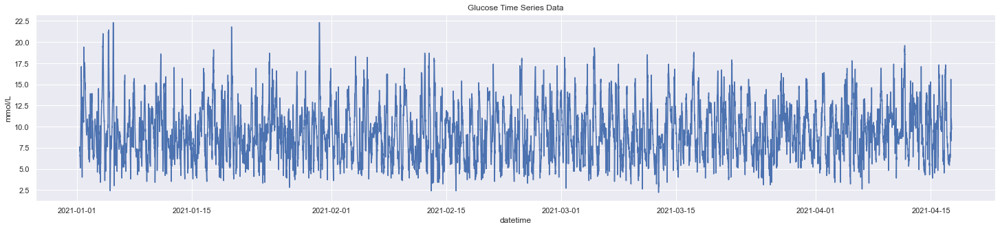

In [45]:
glucose_ax_1 = plot_time_series(df)

## Initial Time Series Graph
- By looking at the time series graph above, there seem to be some outliers in January for high blood sugars 
- Also, there are outliers across each month for low blood sugars 

In [7]:
glucose_ax_1.figure.savefig('graphs/time_series_01-04_2021.png')

## Examine distribution of glucose
- See how the glucoses are distributed in a histogram over the time period

Text(0.5, 1.0, 'Glucose Histogram')

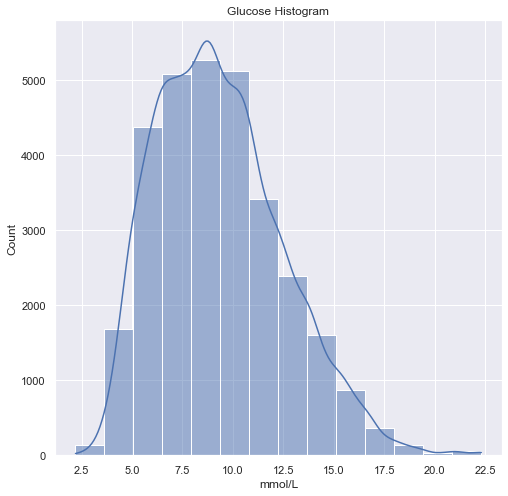

In [9]:
# graph a histplot with 14 bins (since glucose normally ranges from 3-16 from previous knowledge)
import numpy as np
glucose_hist_ax = sns.histplot(x=df['mmol/L'], bins=14, kde=True)
sns.set(rc={'figure.figsize': '8, 8'})
glucose_hist_ax.set_title('Glucose Histogram')

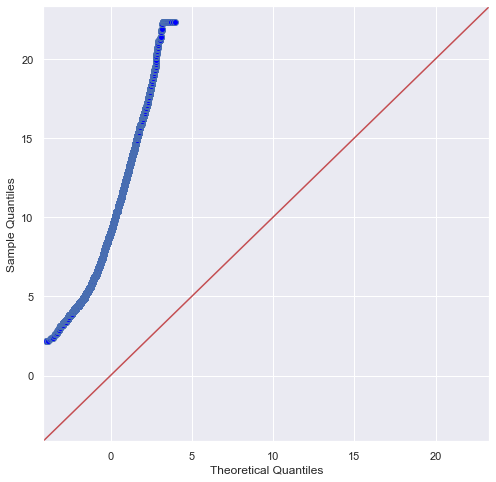

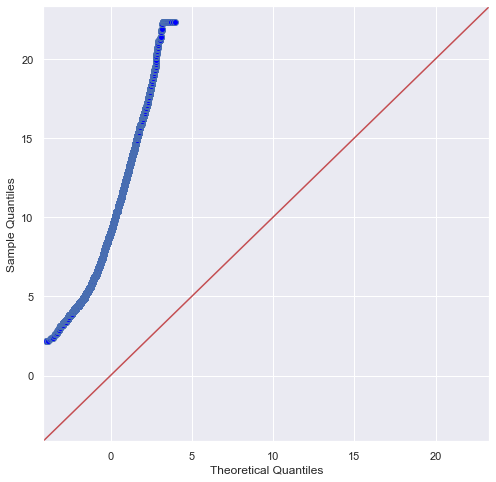

In [24]:
import statsmodels.api as sm
from scipy.stats import norm
import numpy as np

sm.qqplot(df['mmol/L'], line='45')

In [23]:
from statsmodels.stats.diagnostic import lilliefors
lilliefors(df['mmol/L'])

(0.05141479893726214, 0.0009999999999998899)

## Check if data is normally distributed: Findings
- By using a QQ plot and lillie fors hypothesis test, the data is seen to not be normally distributed 
- Z-statistics should not be used to identify outliers for this reason

## Use IQR to look for outliers
- By examining the IQR, outliers can be identified in the data
- To see how many outliers I would be dealing with in the IQR method, plot a boxplot first

Text(0.5, 1.0, 'Glucose Boxplot')

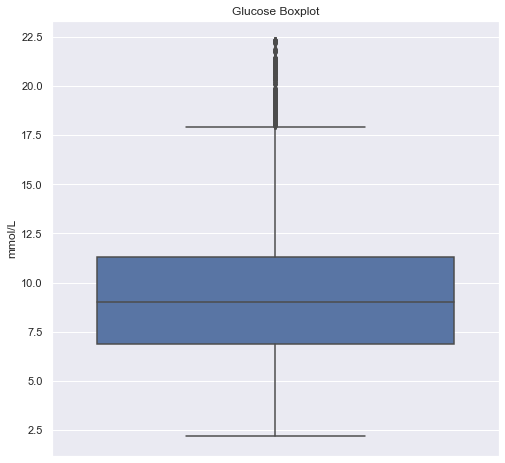

In [26]:
glucose_boxplot_ax = sns.boxplot(y=df['mmol/L'])
glucose_boxplot_ax.set_title('Glucose Boxplot')

## Glucose Boxplot: Findings
- There are no outliers identified for low blood sugars by this method (bad)
- Many high blood sugar (or glucose) readings are above the upper bound

In [27]:
# calculate the IQR and graph on the scatterplot
glucose_q1, glucose_q3 = df['mmol/L'].quantile([0.25, 0.75])
glu_iqr = glucose_q3-glucose_q1

# calculate lower and upper bounds for outliers
glucose_lower = glucose_q1 - (glu_iqr*1.5)
glucose_upper = glucose_q3 + (glu_iqr*1.5)

# fill in the dataframe as an iqr anomaly
df['iqr_anomaly'] = ((df['mmol/L'] > glucose_upper) | (df['mmol/L'] < glucose_lower)).astype(int)

df.head()

,mmol/L,trend,exercise (mins),day,month,year,hours_time,weekday,Elliptical,Running,Walking,basketball,core training,functional strength training,high intensity interval training,martial arts,other,soccer,yoga,iqr_anomaly
datetime,,,,,,,,,,,,,,,,,,,,
2021-01-01 08:01:00,7.6,3.0,NaN,1,1,2021,8.016667,4,0,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:06:00,7.6,3.0,NaN,1,1,2021,8.100000,4,0,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:11:00,7.4,3.0,NaN,1,1,2021,8.183333,4,0,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:16:00,7.4,3.0,NaN,1,1,2021,8.266667,4,0,0,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:21:00,7.2,3.0,NaN,1,1,2021,8.350000,4,0,0,0,0,0,0,0,0,0,0,0,0


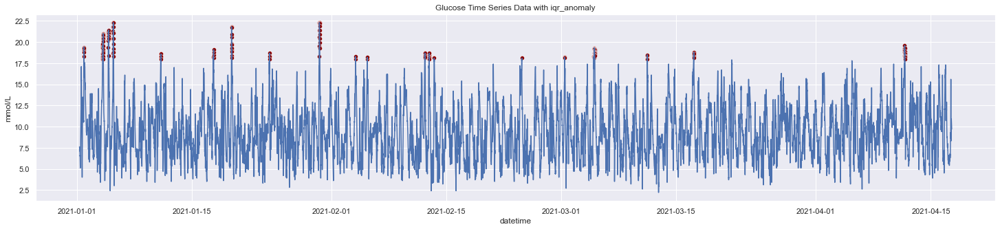

In [57]:
iqr_outliers_ax = plot_time_series(df, outliers='iqr_anomaly')

In [48]:
iqr_outliers_ax.figure.savefig('graphs/iqr_glucose_outliers.png')

## IQR: Findings
- Through IQR, outliers at high glucose levels were identified
- IQR cutoff seem to rigid and did not provide any outliers for low data
- I will look to use other methods that account for low data as well

## Use an isolation forest
- An isolation forest can also be used to determine outliers
- Isolation forests build multiple trees on different features and identify outliers by checking the splits highest up on the trees (through random splits and examining when shorter path lengths occur more consistently to flag as an anomaly) 
- The contamination in this data set is unknown so I must experiment with a few different values to see what works best

In [51]:
from sklearn.ensemble import IsolationForest

def iso_forest(df: pd.DataFrame, n_estimators: int, contamination: int):
    # create an isolation forest model
    iso_f_detector = IsolationForest(n_estimators=n_estimators, contamination=contamination, random_state=8)
    iso_f_detector.fit(df[['mmol/L']])
    # use the fitted isolation forest and add it to the df to see the outliers
    outlier_df = df.copy()
    outlier_df['iso_forest_outlier'] = iso_f_detector.predict(outlier_df[['mmol/L']])
    outlier_df['iso_forest_outlier'].replace({1: 0, -1: 1}, inplace=True)
    return outlier_df

## Test values
- Since I do not know the contamination in the data, I can test 3% outliers

<AxesSubplot:title={'center':'Glucose Time Series Data with iso_forest_outlier'}, xlabel='datetime', ylabel='mmol/L'>

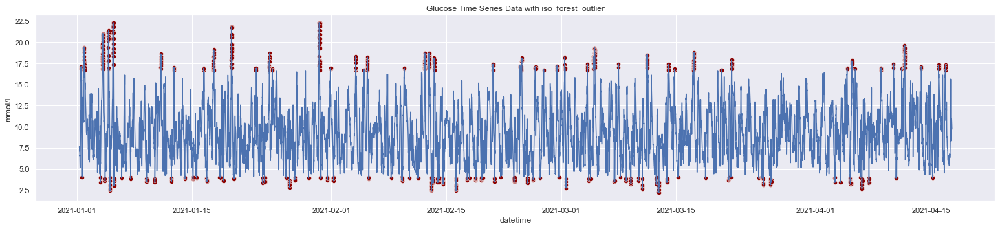

In [58]:
plot_time_series(iso_forest(df, 100, 0.03), 'iso_forest_outlier')

## 3% Iso Forest: Findings
- There are too many outliers with 3%
- From previous knowledge, rare glucose levels should occur very rarely
- Test 1% or lower 

<AxesSubplot:title={'center':'Glucose Time Series Data with iso_forest_outlier'}, xlabel='datetime', ylabel='mmol/L'>

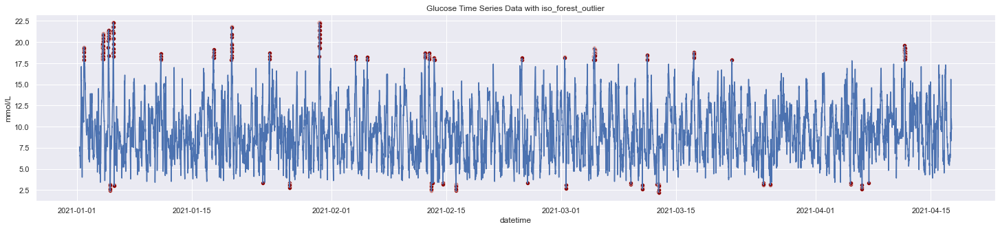

In [60]:
iso_1pct_df = iso_forest(df, 100, 0.01)
plot_time_series(iso_1pct_df, 'iso_forest_outlier')

## 1% Iso Forest: Findings
- There are fewer outliers in the data and they seem to be more representative of the trend 
- Try halving the contamination to 0.5% to see if there is any noticeable difference since there still seem to be a high number of outliers

<AxesSubplot:title={'center':'Glucose Time Series Data with iso_forest_outlier'}, xlabel='datetime', ylabel='mmol/L'>

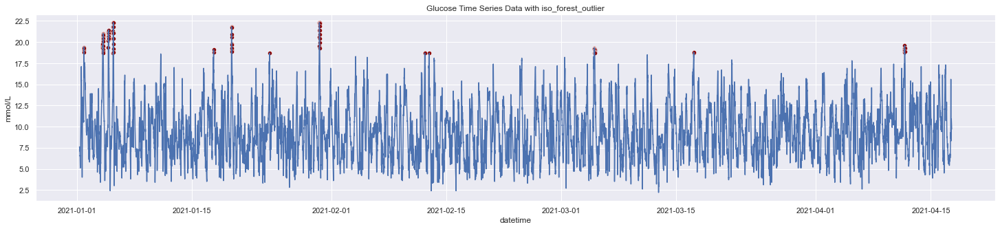

In [61]:
iso_df_2 = iso_forest(df, 100, 0.005)
plot_time_series(iso_df_2, 'iso_forest_outlier')

## 0.5% Iso Forest: Findings
- By removing 0.5% of samples, I have removed all of the low outliers
- To keep the low outliers, test values between 0.5% and 1% to find an optimal value

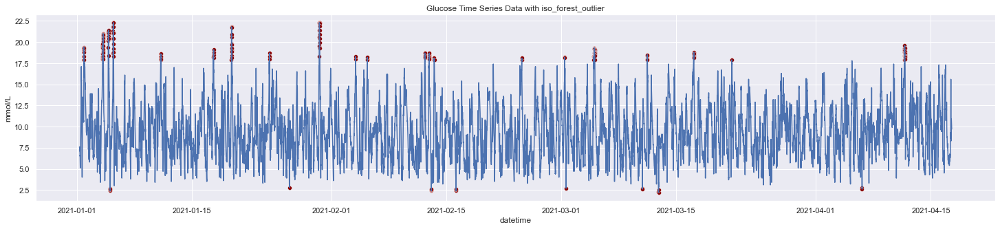

In [68]:
iso_df_3 = iso_forest(df, 100, 0.009)
iso_forest_ax = plot_time_series(iso_df_3, 'iso_forest_outlier')

In [69]:
iso_forest_ax.figure.savefig('graphs/iso_forest_outliers.png')

## Iso Forest: Findings 
- By using a contamination of 0.9% (graph above), low outliers are still preserved
- 0.9% will be the contamination used for the final iso forest model for this reason

In [66]:
df = iso_df_3
df.head()

,mmol/L,trend,exercise (mins),day,month,year,hours_time,weekday,Elliptical,Running,...,basketball,core training,functional strength training,high intensity interval training,martial arts,other,soccer,yoga,iqr_anomaly,iso_forest_outlier
datetime,,,,,,,,,,,,,,,,,,,,,
2021-01-01 08:01:00,7.6,3.0,NaN,1,1,2021,8.016667,4,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:06:00,7.6,3.0,NaN,1,1,2021,8.100000,4,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:11:00,7.4,3.0,NaN,1,1,2021,8.183333,4,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:16:00,7.4,3.0,NaN,1,1,2021,8.266667,4,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-01-01 08:21:00,7.2,3.0,NaN,1,1,2021,8.350000,4,0,0,...,0,0,0,0,0,0,0,0,0,0


## Count the number of outliers in each outlier column
- To see how simple to interpret the results will be, count the number of outliers 
- If the counts are quite high, it may be worth looking into other models as well to find outliers

In [73]:
iqr_outlier_count = df['iqr_anomaly'].gt(0).sum()
iso_forest_outlier_count = df['iso_forest_outlier'].gt(0).sum()
print('IQR Outlier Count: ' + str(iqr_outlier_count))
print('Iso Forest Outlier Count: ' + str(iso_forest_outlier_count)) 

IQR Outlier Count: 226
Iso Forest Outlier Count: 260


## Count Findings (Above)
- Both give me around 250 outlier points (not too bad but could be better)
- Try DBScan, One class SVM and rolling standard devation calculation 
- The method that provides both high and low glucose outliers with the smallest number of outliers will be used to further investigate the anomalies

## Use DBSCAN
- Density-Based Spatial Clustering of Applications with Noise (DBSCAN) is another model for anomaly detection 
- DBSCAN will group points into clusters with 2 main parameters: epsilon and min_samples
- A point will be selected. If there are *min_samples* within *epsilon* distance (using a defined distance metric), then the point is considered a core point 
- Then, recursively choose points in the cluster from that core point and repeat the process
- Points inside of a cluster (ie. they are *epsilon* distance from a core point) that do not contain *min_samples* of points within *epsilon* distance of itself are called border line points 
- If a point is not a border line point or a core point then the point is considered to be an outlier (since it will not be inside the cluster that was built recursively)

In [162]:
from sklearn.cluster import DBSCAN

def dbscan_outlier_detection(df: pd.DataFrame, eps: int, min_samples: int):
    # note: the distance metric I will be using is the Euclidean (L2) distance by default
    dbscan_outlier_detector = DBSCAN(eps=eps, min_samples=min_samples)

    dbscan_df = df.copy()
    dbscan_df = dbscan_df.reset_index(drop=True)['mmol/L'].reset_index()
    dbscan_df['dbscan_outlier'] = dbscan_outlier_detector.fit_predict(dbscan_df)
    dbscan_df['dbscan_outlier'].replace({-1: 1}, inplace=True)
    return dbscan_df

## Findings a good value for eps
- To find an optinal value for *epsilon*, the distance for nearest neighbours can be calculated and plotted 
- The 'elbow' of this graph will provide the ideal value for eps
- **Note**: When applying DBSCAN on one dimensional data (mmol/L) many of the glucose readings will be condensed near the middle
- To find the optimal elbow, try different values of n_neighbours since the proximity in 1D for each point is quite low (may need a larger grouping of points to get better results)

In [157]:
def elbow_method_eps(df: pd.DataFrame):
    """
    Find distances from point to 3rd nearest neighbour and plot

    Article: https://iopscience.iop.org/article/10.1088/1755-1315/31/1/012012/pdf
    """
    glucoses = np.sort(df['mmol/L'])
    # glucoses = [6, 7, 10, 15]
    neighbour_dist = []

    for i in range(len(glucoses)):
        temp_above = i+1
        temp_below = i-1
        for j in range(3):
            # temp_above = i+j
            # temp_below = i-1
            if temp_below >= 0 and temp_above < len(glucoses):
                dist_above = glucoses[temp_above] - glucoses[i]
                dist_below = glucoses[i] - glucoses[temp_below]

                if dist_above < dist_below:
                    # point_dist += dist_above
                    temp_above += 1
                    if j == 2:
                        point_dist = dist_above
                else:
                    # point_dist += dist_below
                    temp_below -= 1
                    if j == 2:
                        point_dist = dist_below
     
                
            else:
                # fails if temp_below is less than 0 or temp_above is greater than or equal to len(glucoses)
                if temp_below < 0:
                    if j == 2:
                        point_dist = glucoses[temp_above] - glucoses[i]
                    temp_above += 1
                else:
                    if j == 2:
                        point_dist = glucoses[i] - glucoses[temp_below]
                    temp_below -= 1
        
        # append the total distance to the neighbour distance
        neighbour_dist.append(point_dist)

    neighbour_dist.sort()
    # print(neighbour_dist)
    fig, ax = plt.subplots(1, figsize=(8, 5))
    ax = plt.plot(neighbour_dist)
    # # ax.set_ylim(0, 1)
    # # ax.set_xlim(0, 31000)
    return ax


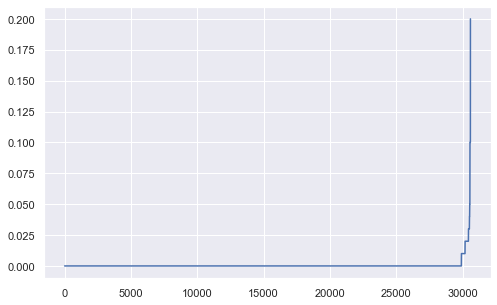

In [158]:
elbow_method_eps(df)

## Elbow Method for eps: Findings
- From the graph above, it appears that the elbow is between 0.01 and 0.02
- Choose eps values between 0.01 and 0.02 for dbscan

<AxesSubplot:title={'center':'Glucose Time Series Data with dbscan_outlier'}, ylabel='mmol/L'>

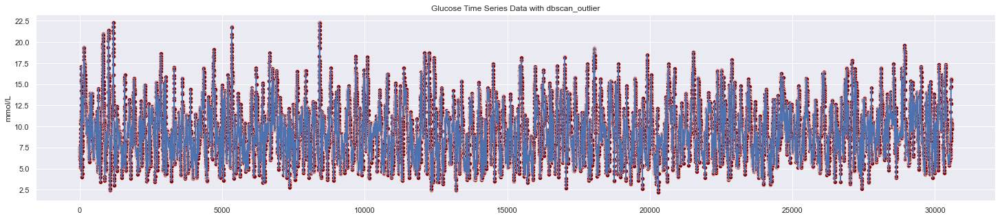

In [174]:
# test dbscan with eps = 0.01 and n_samples=5 (5 glucoses in epsilon range seems reasonable)
plot_time_series(dbscan_outlier_detection(df, 0.01, 5), 'dbscan_outlier')

## DBSCAN: Findings
- Since I am using 1D time series data for glucose, DBSCAN does not work well
- Future reference: Use DBSCAN for clustering with higher dimensional data (and scale data with MinMaxScaler prior to applying DBSCAN)

## One Class SVM
- One class SVM is an unsupervised version of the SVM for anomaly detection
- When the data contains many outliers, it does not do well on the training data and is more used to novelty detection 
- Try one class svm with 'rbf' kernel and nu=0.01 as the amount of outliers to expect

In [179]:
from sklearn.svm import OneClassSVM

def implement_svm(df: pd.DataFrame, nu: float) -> pd.DataFrame:
    svm_detector = OneClassSVM(kernel='rbf', nu=nu)

    df=df.copy()
    time_series = df['mmol/L'].reset_index(drop=True).reset_index()
    df['svm_outlier'] = svm_detector.fit_predict(time_series)
    df['svm_outlier'].replace({-1: 1, 1: 0}, inplace=True)
    return df


<AxesSubplot:title={'center':'Glucose Time Series Data with svm_outlier'}, xlabel='datetime', ylabel='mmol/L'>

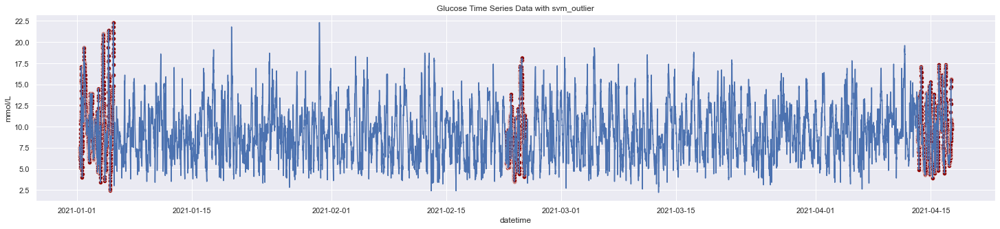

In [182]:
plot_time_series(implement_svm(df, 0.10), 'svm_outlier')

## One Class Svm
- One this time series data, the one class svm does not perform very well 
- The support vectors seem to flag points on the ends and middle of the x axis 

## Decision: Use Isolation Forest to examine low blood sugars
- Since the isolation forest was able to determine outliers in the 1D data (both high and low blood sugars), I can examine the points identified as outliers by the isolation forest

In [186]:
outliers_df = df.loc[df['iso_forest_outlier'] == 1]
outliers_df.head()

,mmol/L,trend,exercise (mins),day,month,year,hours_time,weekday,Elliptical,Running,...,basketball,core training,functional strength training,high intensity interval training,martial arts,other,soccer,yoga,iqr_anomaly,iso_forest_outlier
datetime,,,,,,,,,,,,,,,,,,,,,
2021-01-01 20:41:00,17.9,6.0,NaN,1,1,2021,20.683333,4,0,0,...,0,0,0,0,0,0,0,0,0,1
2021-01-01 20:46:00,18.9,6.0,NaN,1,1,2021,20.766667,4,0,0,...,0,0,0,0,0,0,0,0,1,1
2021-01-01 20:51:00,19.1,6.0,NaN,1,1,2021,20.850000,4,0,0,...,0,0,0,0,0,0,0,0,1,1
2021-01-01 20:56:00,19.4,5.0,NaN,1,1,2021,20.933333,4,0,0,...,0,0,0,0,0,0,0,0,1,1
2021-01-01 21:01:00,19.3,4.0,NaN,1,1,2021,21.016667,4,0,0,...,0,0,0,0,0,0,0,0,1,1


In [191]:
count_danger_occurances = outliers_df.groupby(['month', 'day'])['mmol/L'].count()
print(count_danger_occurances.sum())
count_danger_occurances

260


month  day
1      1       8
       4      52
       5      27
       11      7
       17      5
       19     19
       24      4
       26      1
       30     22
2      3       2
       5       3
       12     21
       13      7
       16      2
       24      3
3      1       3
       4       6
       5      25
       10      2
       11      4
       12      4
       17      9
       21      2
4      6       2
       11     20
Name: mmol/L, dtype: int64

- This matches with the inital number of outliers, now examine the average dangerous blood sugars on these occurances and graph this 

In [193]:
avg_danger_occurances = outliers_df.groupby(['month', 'day'])['mmol/L'].mean()
avg_danger_occurances

month  day
1      1      18.700000
       4      20.176923
       5      19.140741
       11     18.257143
       17     18.536000
       19     19.526316
       24     18.325000
       26      2.800000
       30     21.409091
2      3      18.150000
       5      18.033333
       12     18.366667
       13     11.328571
       16      2.500000
       24     17.966667
3      1      13.000000
       4      18.166667
       5      18.984000
       10      2.650000
       11     18.200000
       12      2.300000
       17     18.466667
       21     17.900000
4      6       2.700000
       11     18.755000
Name: mmol/L, dtype: float64